In [1]:
import tensorflow as tf
import numpy as np
import os
import cv2
import pandas as pd
import pickle
from keras.preprocessing import image 
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, OneHotEncoder
import matplotlib.pyplot as plt
from tensorflow.keras.utils import to_categorical
from skimage.segmentation import mark_boundaries 
from tensorflow.keras import models
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, BatchNormalization, AveragePooling2D, Dense, Dropout, Flatten
from tensorflow.keras.optimizers import Adam
from tensorflow.keras import regularizers
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau

In [2]:
#Get an image from the path to be used on the train test split
def get_img_array(img_paths, dim): 
    result = []
    for path in img_paths:
        img = image.load_img(path, target_size = dim)
        img = image.img_to_array(img)
        img = img/255
        result.append(img)
        
    result = np.array(result)  
    return result

### Make sure that the data has been split and placed in the correct folders. The splitting data is done on the file that is in the ROI splitter folder. (Make sure to have extracted the regions from the xml files, the script to do this is the "parse_region.py" file that is in the Scripts folder in the root directory)

In [3]:
from os import getcwd

cwd = getcwd()
cwd = os.path.join(cwd, "ready_data")

pistols_path = os.path.join(cwd, "pistol")
knives_path = os.path.join(cwd, "knife")
bills_path = os.path.join(cwd, "bills")
no_class_path = os.path.join(cwd, "noWeapon")

print(pistols_path)
print(knives_path)
print(bills_path)
print(no_class_path)

C:\Users\bryan\Desktop\ML-FINAL\data\data with anno\Sohas_weapon-Detection\ready_data\pistol
C:\Users\bryan\Desktop\ML-FINAL\data\data with anno\Sohas_weapon-Detection\ready_data\knife
C:\Users\bryan\Desktop\ML-FINAL\data\data with anno\Sohas_weapon-Detection\ready_data\bills
C:\Users\bryan\Desktop\ML-FINAL\data\data with anno\Sohas_weapon-Detection\ready_data\noWeapon


In [4]:
def my_train_test(pistols_path, knives_path, bills_path, no_class_path):
    
    pistols = [pistols_path+f'\\{i}' for i in os.listdir(pistols_path)]
    knives = [knives_path+f'\\{i}' for i in os.listdir(knives_path)]
    bills = [bills_path+f'\\{i}' for i in os.listdir(bills_path)]
    no_class = [no_class_path+f'\\{i}' for i in os.listdir(no_class_path)]
    
    #shuffle the no_class paths to create some randomness
    np.random.seed(10)
    np.random.shuffle(no_class)
    no_class = no_class[:len(pistols) - 200]
    
    #Create lables
    
    pistol_labels = [1 for i in range(len(pistols))]
    knife_labels = [2 for i in range(len(knives))]
    bills_labels = [3 for i in range(len(bills))]
    no_class_labels = [0 for i in range(len(no_class))]
    
    paths = pistols + knives + bills + no_class
    labels = pistol_labels + knife_labels + bills_labels + no_class_labels
        
    x_train, x_test, y_train, y_test = train_test_split(paths, labels, stratify = labels, train_size = .90, random_state = 10)
    
    #Get the actual images from the paths
    
    x_train_2 = get_img_array(x_train, (150,150))
    x_test_2 = get_img_array(x_test, (150,150))
    
    y_train = np.array(y_train)
    y_test = np.array(y_test)
    
    y_test = to_categorical(y_test)
    y_train = to_categorical(y_train)
    
    return  x_train_2, x_test_2, y_train, y_test


x_train, x_test, y_train, y_test = my_train_test(pistols_path,knives_path,bills_path,no_class_path)

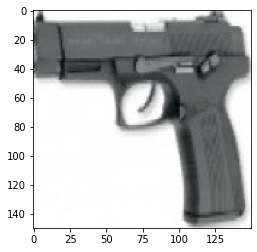

In [5]:
plt.imshow(x_train[45])

In [2]:
def get_conv_model(dim = (150,150, 3)):
    '''This function will create and compile a CNN given the input dimension'''
    inp_shape = dim
    act = 'relu'
    drop = .25
    kernal_reg = regularizers.l1(.001)
    optimizer = Adam(learning_rate = .0001)    
    model = Sequential() 
    model.add(Conv2D(64, kernel_size=(3,3),activation=act, input_shape = inp_shape, 
                     kernel_regularizer = kernal_reg,
                     kernel_initializer = 'he_uniform',  padding = 'same', name = 'Input_Layer'))
    model.add(MaxPooling2D(pool_size=(2, 2),  strides = (3,3)))
    
    model.add(Conv2D(64, (3, 3), activation=act, kernel_regularizer = kernal_reg, 
                     kernel_initializer = 'he_uniform',padding = 'same'))
    model.add(MaxPooling2D(pool_size=(2, 2), strides = (3,3))) 
    
    model.add(Conv2D(128, (3, 3), activation=act, kernel_regularizer = kernal_reg, 
                     kernel_initializer = 'he_uniform',padding = 'same'))
    model.add(Conv2D(128, (3, 3), activation=act, kernel_regularizer = kernal_reg, 
                     kernel_initializer = 'he_uniform',padding = 'same'))
    
    model.add(MaxPooling2D(pool_size=(2, 2), strides = (3,3)))  
    
    model.add(Flatten())
    
    model.add(Dense(128, activation='relu'))
    
    model.add(Dense(64, activation='relu'))
    
    model.add(Dense(32, activation='relu'))
    
    model.add(Dropout(drop))
    
    model.add(Dense(4, activation='softmax', name = 'Output_Layer'))
    
    model.compile(loss = 'categorical_crossentropy', optimizer = optimizer, metrics = ['accuracy'])
    return model 

In [24]:
#prevents overfitting and saves models every time the validation loss improves
early_stopping = EarlyStopping(monitor='val_loss', verbose = 1, patience=10, min_delta = .00075)

model_checkpoint = ModelCheckpoint('ModelWeights.h5', verbose = 1, save_best_only=True,
                                  monitor = 'val_loss')

lr_plat = ReduceLROnPlateau(patience = 2, mode = 'min')

epochs = 1000
batch_size = 32
model = get_conv_model()

model_history = model.fit(x_train, y_train, batch_size = batch_size,
            epochs = epochs, 
     callbacks = [early_stopping, model_checkpoint, lr_plat], validation_data = (x_test, y_test), verbose= 1)


Epoch 1/1000
219/219 [==============================] - ETA: 0s - loss: 10.6412 - accuracy: 0.7377
Epoch 1: val_loss improved from inf to 9.07341, saving model to ModelWeights.h5
219/219 [==============================] - 65s 293ms/step - loss: 10.6412 - accuracy: 0.7377 - val_loss: 9.0734 - val_accuracy: 0.8216 - lr: 1.0000e-04
Epoch 2/1000
219/219 [==============================] - ETA: 0s - loss: 8.0291 - accuracy: 0.8287
Epoch 2: val_loss improved from 9.07341 to 7.04047, saving model to ModelWeights.h5
219/219 [==============================] - 65s 299ms/step - loss: 8.0291 - accuracy: 0.8287 - val_loss: 7.0405 - val_accuracy: 0.8485 - lr: 1.0000e-04
Epoch 3/1000
219/219 [==============================] - ETA: 0s - loss: 6.3345 - accuracy: 0.8448
Epoch 3: val_loss improved from 7.04047 to 5.69192, saving model to ModelWeights.h5
219/219 [==============================] - 66s 300ms/step - loss: 6.3345 - accuracy: 0.8448 - val_loss: 5.6919 - val_accuracy: 0.8575 - lr: 1.0000e-04
Epo

219/219 [==============================] - 65s 296ms/step - loss: 1.3937 - accuracy: 0.9740 - val_loss: 1.5040 - val_accuracy: 0.9217 - lr: 1.0000e-04
Epoch 26/1000
219/219 [==============================] - ETA: 0s - loss: 1.3424 - accuracy: 0.9716
Epoch 26: val_loss improved from 1.50396 to 1.47177, saving model to ModelWeights.h5
219/219 [==============================] - 64s 293ms/step - loss: 1.3424 - accuracy: 0.9716 - val_loss: 1.4718 - val_accuracy: 0.9127 - lr: 1.0000e-04
Epoch 27/1000
219/219 [==============================] - ETA: 0s - loss: 1.2947 - accuracy: 0.9742
Epoch 27: val_loss improved from 1.47177 to 1.42100, saving model to ModelWeights.h5
219/219 [==============================] - 65s 295ms/step - loss: 1.2947 - accuracy: 0.9742 - val_loss: 1.4210 - val_accuracy: 0.9191 - lr: 1.0000e-04
Epoch 28/1000
219/219 [==============================] - ETA: 0s - loss: 1.2355 - accuracy: 0.9754
Epoch 28: val_loss improved from 1.42100 to 1.36716, saving model to ModelWeight

219/219 [==============================] - 64s 294ms/step - loss: 0.5953 - accuracy: 0.9906 - val_loss: 0.8288 - val_accuracy: 0.9217 - lr: 1.0000e-04
Epoch 51/1000
219/219 [==============================] - ETA: 0s - loss: 0.5652 - accuracy: 0.9943
Epoch 51: val_loss improved from 0.82877 to 0.82132, saving model to ModelWeights.h5
219/219 [==============================] - 64s 294ms/step - loss: 0.5652 - accuracy: 0.9943 - val_loss: 0.8213 - val_accuracy: 0.9191 - lr: 1.0000e-04
Epoch 52/1000
219/219 [==============================] - ETA: 0s - loss: 0.5461 - accuracy: 0.9949
Epoch 52: val_loss improved from 0.82132 to 0.81105, saving model to ModelWeights.h5
219/219 [==============================] - 64s 293ms/step - loss: 0.5461 - accuracy: 0.9949 - val_loss: 0.8110 - val_accuracy: 0.9255 - lr: 1.0000e-04
Epoch 53/1000
219/219 [==============================] - ETA: 0s - loss: 0.5368 - accuracy: 0.9931
Epoch 53: val_loss improved from 0.81105 to 0.78881, saving model to ModelWeight

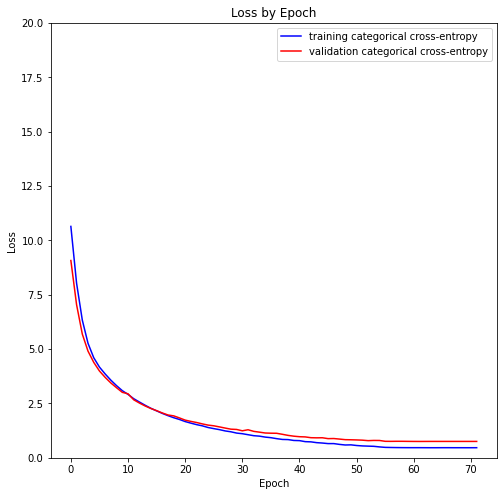

In [26]:
plt.figure(figsize=(8,8))
plt.plot(model_history.history['loss'], label='training categorical cross-entropy', color='blue')
plt.plot(model_history.history['val_loss'], label='validation categorical cross-entropy', color='red')
plt.title('Loss by Epoch')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.ylim([0.0, 20])
plt.legend(loc='upper right')

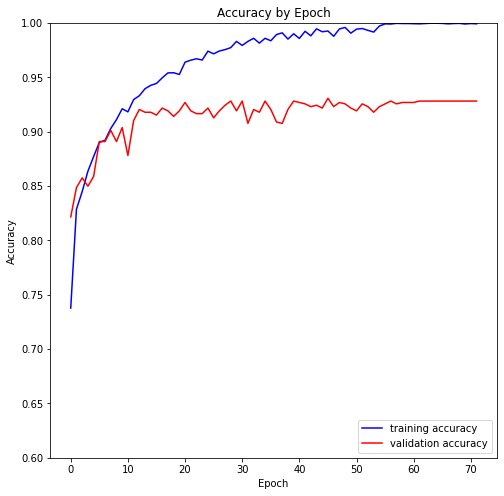

In [28]:
plt.figure(figsize=(8,8))
plt.plot(model_history.history['accuracy'], label='training accuracy',color='blue')
plt.plot(model_history.history['val_accuracy'], label = 'validation accuracy',color='red')
plt.title('Accuracy by Epoch')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.ylim([0.6, 1.])
plt.legend(loc='lower right')

### Non maximum suppression algorithm was adapted from [here](https://pyimagesearch.com/2014/11/17/non-maximum-suppression-object-detection-python/)

In [3]:
def non_max_suppression(boxes, overlapThresh= .5):
    '''This image was taken from PyImageSearch... again cannot thank that guy enough'''
    # if there are no boxes, return an empty list
    if len(boxes) == 0:
        return []
    # if the bounding boxes integers, convert them to floats --
    # this is important since we'll be doing a bunch of divisions
    if boxes.dtype.kind == "i":
        boxes = boxes.astype("float")
    # initialize the list of picked indexes	
    pick = []
    # grab the coordinates of the bounding boxes
    x1, y1, x2, y2 = boxes[:,0], boxes[:,1], boxes[:,2], boxes[:,3]    
    # compute the area of the bounding boxes and sort the bounding
    # boxes by the bottom-right y-coordinate of the bounding box
    area = (x2 - x1 + 1) * (y2 - y1 + 1)
    idxs = np.argsort(y2)
    # keep looping while some indexes still remain in the indexes
    # list
    while len(idxs) > 0:
        # grab the last index in the indexes list and add the
        # index value to the list of picked indexes
        last = len(idxs) - 1
        i = idxs[last]
        pick.append(i)
        # find the largest (x, y) coordinates for the start of
        # the bounding box and the smallest (x, y) coordinates
        # for the end of the bounding box
        xx1, yy1, xx2, yy2 = np.maximum(x1[i], x1[idxs[:last]]), np.maximum(y1[i], y1[idxs[:last]]), np.minimum(x2[i], x2[idxs[:last]]), np.minimum(y2[i], y2[idxs[:last]])
        # compute the width and height of the bounding box
        w, h = np.maximum(0, xx2 - xx1 + 1), np.maximum(0, yy2 - yy1 + 1)
        # compute the ratio of overlap
        overlap = (w * h) / area[idxs[:last]]
        # delete all indexes from the index list that have
        idxs = np.delete(idxs, np.concatenate(([last],
            np.where(overlap > overlapThresh)[0])))
    # return only the bounding boxes that were picked using the
    # integer data type
    return pick


In [29]:
def get_img_prediction_bounding_box(path, model, fig, dim, fig_num):
    '''This function will create a bounding box over what it believes is a weapon given the image path, dimensions, and model used to detect the weapon.  Dimensions can be found within the Var.py file.  This function is still being used as I need to apply non-max suppresion to create only one bounding box'''
    img = image.load_img(path, target_size = dim)
    img = image.img_to_array(img)
    img = img/255
    
    img = img.reshape(1, img.shape[0], img.shape[1], 3)
    pred = model.predict(img)[0]
    category_dict = {0: 'No Weapon', 1: 'Pistol', 2: 'Knife', 3: 'Bill'}
    cat_index = np.argmax(pred)
    cat = category_dict[cat_index]
    print(f'{path}\t\tPrediction: {cat}\t{int(pred.max()*100)}% Confident')

    #speed up cv2
    cv2.setUseOptimized(True)
    cv2.setNumThreads(4) #change depending on your computer
    #read the image
    img = cv2.imread(path)
    
    #make two copies
    clone = img.copy() 
    clone2 = img.copy()
    
    #Set up selective image search algo
    ss = cv2.ximgproc.segmentation.createSelectiveSearchSegmentation()
    ss.setBaseImage(img)
    ss.switchToSelectiveSearchFast()

    rects = ss.process() 
    windows = []
    locations = []
    print(f'Creating Bounding Boxes for {path}')
    
    for x, y, w,h in rects[:1001]: 
        startx, starty, endx, endy = x, y, x+w, y+h 
        roi = img[starty:endy, startx:endx]
        roi = cv2.resize(roi, dsize =dim, interpolation = cv2.INTER_CUBIC)
        windows.append(roi)
        locations.append((startx, starty, endx, endy))
    
    windows = np.array(windows)
    windows = windows.reshape(windows.shape[0], windows.shape[1], windows.shape[2], 3)
    windows = np.array(windows)
    locations = np.array(locations)
    predictions = model.predict(windows)
    nms = non_max_suppression(locations)
    bounding_cnt = 0
    
    for idx in nms:
        if np.argmax(predictions[idx]) != cat_index: 
            continue
        startx, starty, endx, endy = locations[idx]
        cv2.rectangle(clone, (startx, starty), (endx, endy), (0,0,255), 2)
        text = f'{category_dict[np.argmax(predictions[idx])]}: {int(predictions[idx].max()*100)}%'
        cv2.putText(clone, text, (startx, starty+15), cv2.FONT_HERSHEY_SIMPLEX, .5, (0,255,0),2)
        bounding_cnt += 1

    if bounding_cnt == 0: 
        
        pred_idx= [idx for idx, i in enumerate(predictions) if np.argmax(i) == cat_index]
        cat_locations = np.array([locations[i] for i in pred_idx])
        nms = non_max_suppression(cat_locations)
        
        if len(nms)==0:
            
            cat_predictions = predictions[:,cat_index]
            pred_max_idx = np.argmax(cat_predictions)
            pred_max = cat_predictions[pred_max_idx]
            pred_max_window = locations[pred_max_idx]
            startx, starty, endx, endy = pred_max_window
            cv2.rectangle(clone, (startx, starty), (endx, endy),  (0,0,255),2)
            text = f'{category_dict[cat_index]}: {int(pred_max*100)}%'
            cv2.putText(clone, text, (startx, starty+15), cv2.FONT_HERSHEY_SIMPLEX, .5, (0,255,0),2)
        
        for idx in nms: 
            
            startx, starty, endx, endy = cat_locations[idx]
            cv2.rectangle(clone, (startx, starty), (endx, endy), (0,0,255), 2)
            text = f'{category_dict[np.argmax(predictions[pred_idx[idx]])]}: {int(predictions[pred_idx[idx]].max()*100)}%'
            cv2.putText(clone, text, (startx, starty+15), cv2.FONT_HERSHEY_SIMPLEX, .5, (0,255,0),2)        
    
    print('~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~')
    #cv2.imshow(f'Test', np.hstack([clone, clone2]))
    #cv2.waitKey(0)
    fig.add_subplot(rows,cols, fig_num)
    plt.imshow(clone)
    plt.axis('off')
    fig.add_subplot(rows,cols, fig_num + 1)
    plt.imshow(clone2)
    plt.axis('off')
    
    ss.clear()
    return predictions, fig

### uncomment the code below to load the model with pre-trained weights. (Path to the weights of the model needs to be updated)

In [26]:
model = get_conv_model()
model.load_weights('ModelWeights.h5') #path to the model weights

### This uses non-maximum supression without taking the prediction scores into account

C:\Users\bryan\Desktop\ML-FINAL\data\data with anno\Sohas_weapon-Detection\Test\(1).jpg		Prediction: Pistol	100% Confident
Creating Bounding Boxes for C:\Users\bryan\Desktop\ML-FINAL\data\data with anno\Sohas_weapon-Detection\Test\(1).jpg
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
C:\Users\bryan\Desktop\ML-FINAL\data\data with anno\Sohas_weapon-Detection\Test\armas (1079).jpg		Prediction: Pistol	68% Confident
Creating Bounding Boxes for C:\Users\bryan\Desktop\ML-FINAL\data\data with anno\Sohas_weapon-Detection\Test\armas (1079).jpg
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
C:\Users\bryan\Desktop\ML-FINAL\data\data with anno\Sohas_weapon-Detection\Test\armas (1080).jpg		Prediction: Pistol	98% Confident
Creating Bounding Boxes for C:\Users\bryan\Desktop\ML-FINAL\data\data with anno\Sohas_weapon-Detection\Test\armas (1080).jpg
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
C:\Users\bryan\Desktop\M

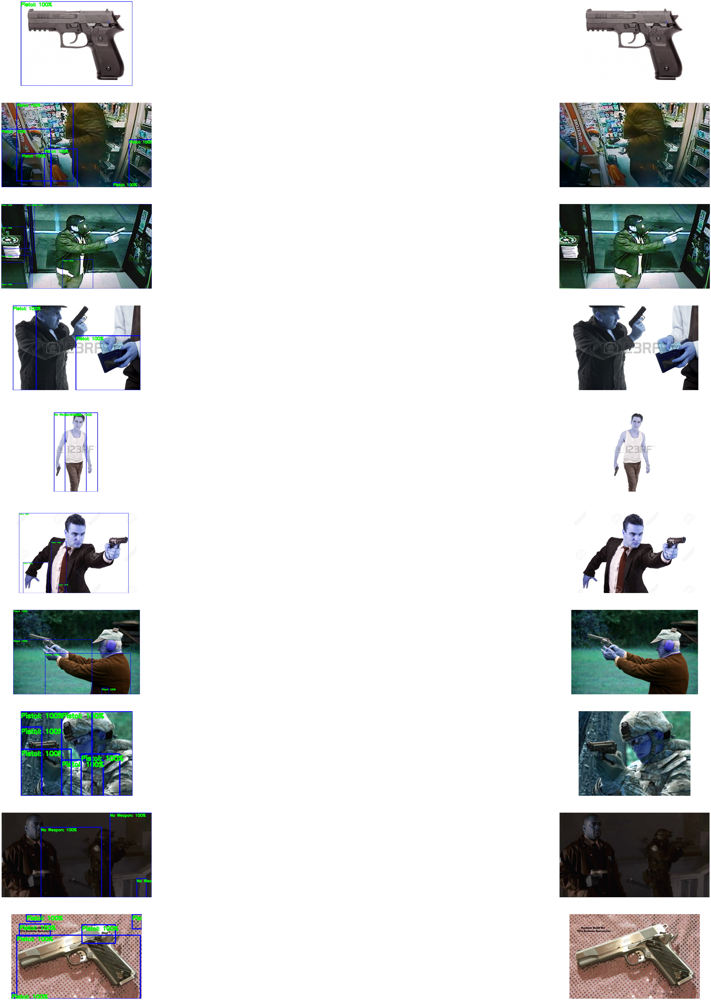

In [30]:
from os import getcwd
p = getcwd()
test_folder = os.path.join(p,'Test') #folder where you will put your images to test
predictions = []

fig = plt.figure(figsize=(100,100))
fig_num = 1
rows = 10
cols = 2

for idx, i in enumerate([i for i in os.listdir(test_folder) if i != 'ipynb_checkpoints']):
    img_path = f'{test_folder}\\{i}'
    pred, fig = get_img_prediction_bounding_box(img_path, model,fig, dim = (150,150), fig_num=fig_num)
    predictions.append(pred)
    fig_num +=2

### This one takes the prediction scores into account

In [58]:
def get_img_prediction_bounding_box_2(path, model, fig, dim, fig_num):
    '''This function will create a bounding box over what it believes is a weapon given the image path, dimensions, and model used to detect the weapon.  Dimensions can be found within the Var.py file.  This function is still being used as I need to apply non-max suppresion to create only one bounding box'''
    img = image.load_img(path, target_size = dim)
    img = image.img_to_array(img)
    img = img/255
    
    img = img.reshape(1, img.shape[0], img.shape[1], 3)
    pred = model.predict(img)[0]
    category_dict = {0: 'No Weapon', 1: 'Pistol', 2: 'Knife', 3: 'Bill'}
    cat_index = np.argmax(pred)
    cat = category_dict[cat_index]
    print(f'{path}\t\tPrediction: {cat}\t{int(pred.max()*100)}% Confident')

    #speed up cv2
    cv2.setUseOptimized(True)
    cv2.setNumThreads(4) #change depending on your computer
    #read the image
    img = cv2.imread(path)
    
    #make two copies
    clone = img.copy() 
    clone2 = img.copy()
    
    #Set up selective image search algo
    ss = cv2.ximgproc.segmentation.createSelectiveSearchSegmentation()
    ss.setBaseImage(img)
    ss.switchToSelectiveSearchFast()

    rects = ss.process() 
    windows = []
    locations = []
    print(f'Creating Bounding Boxes for {path}')
    
    for x, y, w,h in rects[:1001]: 
        startx, starty, endx, endy = x, y, x+w, y+h 
        roi = img[starty:endy, startx:endx]
        roi = cv2.resize(roi, dsize =dim, interpolation = cv2.INTER_CUBIC)
        windows.append(roi)
        locations.append((startx, starty, endx, endy))
    
    windows = np.array(windows)
    windows = windows.reshape(windows.shape[0], windows.shape[1], windows.shape[2], 3)
    windows = np.array(windows)
    locations = np.array(locations)
    predictions = model.predict(windows)
    nms = non_max_suppression(locations)
    bounding_cnt = 0
    
    proposed_loc = []
    score_for_loc = []
    category_index = []
    
    for idx in nms:
        print("predictions:", predictions[idx])
        if np.argmax(predictions[idx]) != cat_index: 
            continue
        startx, starty, endx, endy = locations[idx]
        proposed_loc.append(np.array([startx, starty, endx, endy]))
        score_for_loc.append(predictions[idx].max())
        category_index.append(np.argmax(predictions[idx]))
        bounding_cnt += 1

    if bounding_cnt == 0: 
        
        pred_idx= [idx for idx, i in enumerate(predictions) if np.argmax(i) == cat_index]
        cat_locations = np.array([locations[i] for i in pred_idx])
        nms = non_max_suppression(cat_locations)
        
        if len(nms)==0:
            
            cat_predictions = predictions[:,cat_index]
            pred_max_idx = np.argmax(cat_predictions)
            pred_max = cat_predictions[pred_max_idx]
            pred_max_window = locations[pred_max_idx]
            startx, starty, endx, endy = pred_max_window
            cv2.rectangle(clone, (startx, starty), (endx, endy),  (0,0,255),2)
            text = f'{category_dict[cat_index]}: {int(pred_max*100)}%'
            cv2.putText(clone, text, (startx, starty+15), cv2.FONT_HERSHEY_SIMPLEX, .5, (0,255,0),2)
        
        for idx in nms: 
            
            startx, starty, endx, endy = cat_locations[idx]
            cv2.rectangle(clone, (startx, starty), (endx, endy), (0,0,255), 2)
            text = f'{category_dict[np.argmax(predictions[pred_idx[idx]])]}: {int(predictions[pred_idx[idx]].max()*100)}%'
            cv2.putText(clone, text, (startx, starty+15), cv2.FONT_HERSHEY_SIMPLEX, .5, (0,255,0),2)
            
    print("locations:", proposed_loc)
    print("score::", score_for_loc)
    print("indexes:", category_index)
    
    if len(score_for_loc) != 0:
        pred_index = np.argmax(np.array(score_for_loc))
        region = proposed_loc[pred_index]
        cv2.rectangle(clone, (region[0], region[1]), (region[2], region[3]), (0,0,255), 2)
        text = f'{category_dict[cat_index]}: {int(score_for_loc[pred_index]*100)}%'
        cv2.putText(clone, text, (region[0], region[1]+15), cv2.FONT_HERSHEY_SIMPLEX, .5, (0,255,0),2)
        
    print('~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~')
    #cv2.imshow(f'Test', np.hstack([clone, clone2]))
    #cv2.waitKey(0)
    fig.add_subplot(rows,cols, fig_num)
    plt.imshow(clone)
    plt.axis('off')
    fig.add_subplot(rows,cols, fig_num + 1)
    plt.imshow(clone2)
    plt.axis('off')
    
    ss.clear()
    return predictions, fig

C:\Users\bryan\Desktop\ML-FINAL\data\data with anno\Sohas_weapon-Detection\Test\(1).jpg		Prediction: Pistol	100% Confident
Creating Bounding Boxes for C:\Users\bryan\Desktop\ML-FINAL\data\data with anno\Sohas_weapon-Detection\Test\(1).jpg
predictions: [0. 1. 0. 0.]
locations: [array([  0,   0, 350, 265])]
score:: [1.0]
indexes: [1]
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
C:\Users\bryan\Desktop\ML-FINAL\data\data with anno\Sohas_weapon-Detection\Test\armas (1079).jpg		Prediction: Pistol	68% Confident
Creating Bounding Boxes for C:\Users\bryan\Desktop\ML-FINAL\data\data with anno\Sohas_weapon-Detection\Test\armas (1079).jpg
predictions: [0. 1. 0. 0.]
predictions: [0. 0. 0. 1.]
predictions: [0. 0. 1. 0.]
predictions: [1. 0. 0. 0.]
predictions: [1. 0. 0. 0.]
predictions: [0. 1. 0. 0.]
locations: [array([450, 328, 473, 346]), array([  0,   0, 608, 346])]
score:: [1.0, 1.0]
indexes: [1, 1]
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

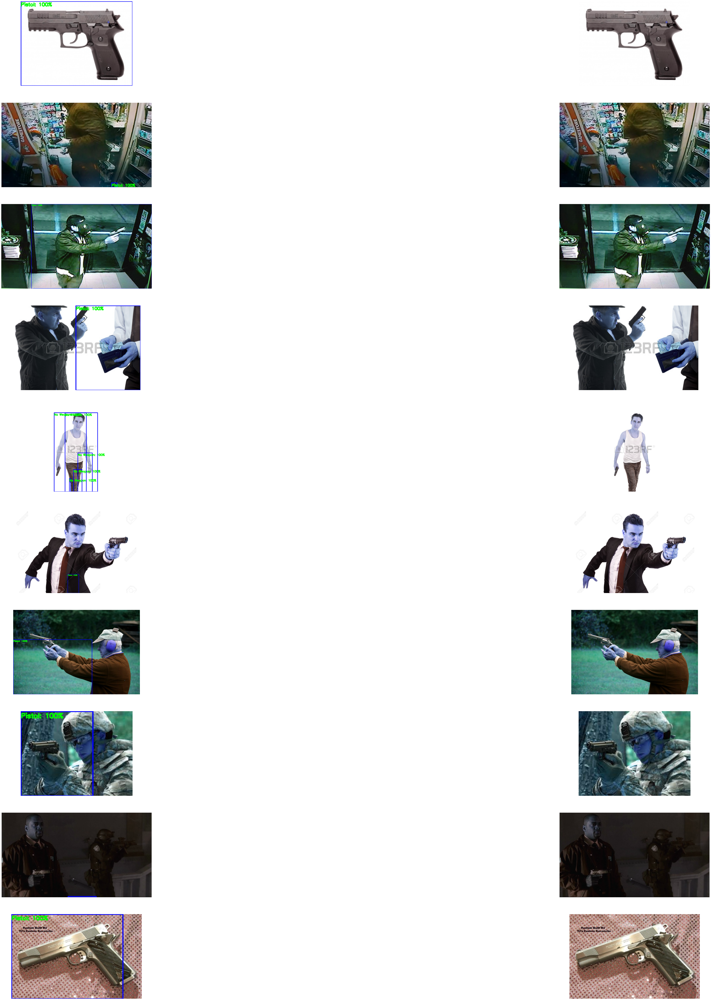

In [60]:
p = getcwd()
test_folder = os.path.join(p,'Test') #folder where you will put your images to test
predictions = []

fig = plt.figure(figsize=(100,100))
fig_num = 1
rows = 10
cols = 2

for idx, i in enumerate([i for i in os.listdir(test_folder) if i != 'ipynb_checkpoints']):
    img_path = f'{test_folder}\\{i}'
    pred, fig = get_img_prediction_bounding_box_2(img_path, model,fig, dim = (150,150), fig_num=fig_num)
    predictions.append(pred)
    fig_num +=2